# Introduction to Deep Convolutional Generative Adversarial Networks

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 0
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  0


# Inputs

- dataroot - the path to the root of the dataset folder. 
- workers - the number of worker threads for loading the data with the DataLoader
- batch_size - the batch size used in training. The DCGAN paper uses a batch size of 128
- image_size - the spatial size of the images used for training. This implementation defaults to 64x64. If another size is desired, the structures of D and G must be changed. See here for more details
- nc - number of color channels in the input images. For color images this is 3
- nz - length of latent vector
- ngf - relates to the depth of feature maps carried through the generator
- ndf - sets the depth of feature maps propagated through the discriminator
- num_epochs - number of training epochs to run. Training for longer will probably lead to better results but will also take much longer
- lr - learning rate for training. As described in the DCGAN paper, this number should be 0.0002
- beta1 - beta1 hyperparameter for Adam optimizers. As described in paper, this number should be 0.5
- ngpu - number of GPUs available. If this is 0, code will run in CPU mode. If this number is greater than 0 it will run on that number of GPUs

In [2]:
# Root directory for dataset
dataroot = "data/celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 2

# Load Celeb-A faces dataset
Using ImageFolder dataset class, import images from the dataset's root folder

In [3]:
trans = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [4]:
dataset = dset.ImageFolder(
    root = dataroot,
    transform = trans
)

In [5]:
# Create DataLoader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

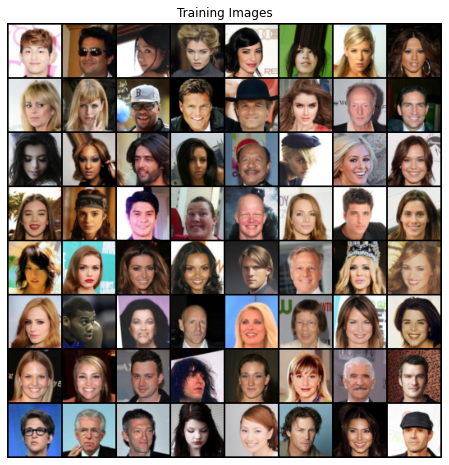

In [6]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# DCGAN Implementation

## Weight Initialization
DCGAN 논문에서, 저자는 모델의 가중치가 mean=0. stdev=0.2인 정규분포로 초기화된다고 합니다.<br>
``weights_init``함수는 초기화된 모델속, convolutional, convolution-transpose, batch-normalization layer의 가중치를 초기화합니다.<br>

In [7]:
# custom weights initialization called on netG and netD
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1: # Conv가 존재시
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1: # BatchNorm이 존재시
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

# Generator

Generator(**G**)는 **latent space vector(z)**를 data-space에 mapping하는 역할을 합니다.<br>
celeba 데이터에서는, z를 data-space로 매핑하는 것은 훈련 이미지들과 동일한 사이즈를 가지는 RGB이미지들을 만드는 것입니다<br>
실제로, 이것은 연속된 strided convolution을 거쳐서 달서오딜 수 있으며, 각각은 아래 그림처럼 2d batch-norm과 relu activation이 이어집니다.<br>
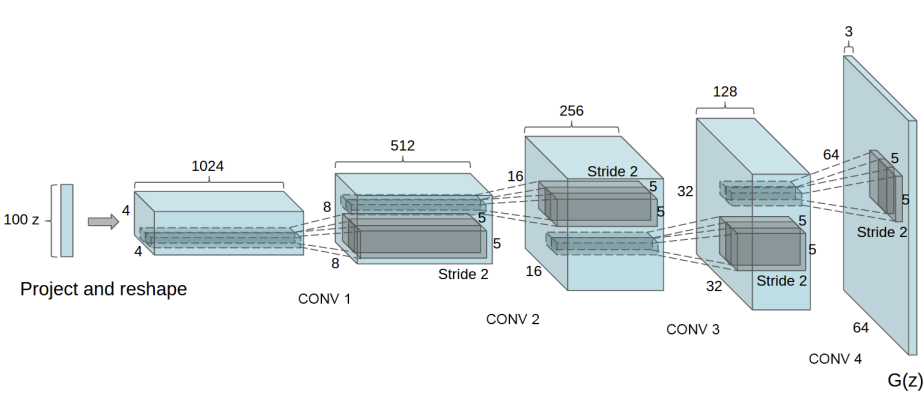
Generator의 output은 tanh 활성화 함수를 통과하여 [-1, 1]사이의 출력값을 받게 됩니다. 특히 conv layer이후에 오는 batchNorm layer는 논문에서 언급했듯이 매우 중요한데, **훈련시 gradient-flow에 도움을 주어, 학습이 잘 되도록 합니다.** Input section인 (nz, ngf, and nc)는 generator 구조에 영향을 끼칩니다. **nz는 z input vector의 길이(dim)을 의미하며, ngf는 generator에서 propagtion이 일어나는 feature map의 크기를 의미하고, nc는 output image의 채널 수를 의미합니다.**

In [8]:
# Generator Code
class Generator(nn.Module):
    
     def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )
    
     def forward(self, input):
        return self.main(input)

Generator를 이제 ``weights_init``함수를 이용하여 초기화한 상태로 만들어보겠습니다. 

In [11]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda0') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Discriminator
Discriminator D는 input 이미지에 대해 real, fake로 판단하는 확률을 출력하는 binary classfier입니다.<br>
여기서 D는 3x64x64의 입력 이미지를 받고, Conv2d, BatchNorm2d, LeakyReLu 계층을 거쳐서 최종적으로 sigmoid를 통과하여 출력값을 반환합니다.<br>
아키텍쳐를 조금 더 늘릴수는 있지만, 중요한 부분은 **strided convolution, BatchNorm2d, LeakyReLu을 사용하는 것입니다**<br>
DCGAN 논문에서는 **pooling대신 strided conv를 사용하는 것이 효과적이라 언급하는데, 이는 신경망이 스스로 poooling을 학습하기 때문입니다. BatchNorm과 Leaky ReLu는 graident flow에 도움을 주어, G와 D가 잘 학습하도록 도와줍니다.** 

In [12]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Discriminator 역시 ``weights_init``함수를 이용하여 초기화한 상태로 만들어보겠습니다. 

In [13]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda0') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Loss Functions and Optimizers
D와 G를 학습시키기 위해서, GANs의 기본적인 loss함수인 ``Binary Cross Entropy`` function 함수를 기반으로 합니다. 
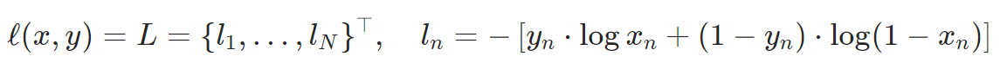
Real label을 1, fake label을 0으로 합니다. D와 G의 optimzier를 가각 따로 사용하며, DCGAN 논문에서는 **``Adam optimizer``**(learning_rate = 0.002, Beta1=0.5)를 사용합니다. Gnerator의 학습 과정을 추적하기 위해서, 고정된 가우시안 분포로부터 생성된 latent vector의 배치를 만듭니다. 훈련 과정에서, 이 fixed_noise 배치를 G에 넣어주고, 수많은 반복 이후 노이즈로부터 생성된 이미지들을 살필 수 있습니다.

In [14]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training
훈련은 크게 Dsicriminator를 학습시킨 후에, Generator를 학습시키는 순서로 진행됩니다.

## Part 1. Train the Discriminator
Discriminator의 목표는 주어진 이미지를 올바르게 fake/real 판별하는 능력을 극대화하는 것이었습니다. Goodfellow의 "update the discriminator by ascending its stochastic gradient"라는 말속에서, **discrminator는 log(D(x)) + log(1-D(G(z)))를 maximize**하는 방향으로 학습시키려 합니다. Mini-batch를 이용하여, 먼저 real samples들의 batches를 만들고 D에 통과시켜서 **loss(log(D(x)))**를 구하고, 이에 대한 gradient를 구합니다. 다음으로, generator에서 얻는 fake sameples의 batches를 만들고, D에 통과시켜서 **log(1-D(G(z)))**를 구하고 gradient를 누적시켜 back-propagation에 사용합니다. 누적된 gradient값을 가지고 optimizer를 통해서 학습을 진행하게 됩니다

## Part 2. Train the Generator
논문에서 언급된 것처럼, Generator는 **log(1-D(G(z)))**를 최소화하고자 하여, better fakes를 만들고자 합니다. **Goodfellow의 초기 논문을 보면, gradient가 초기단계서 충분하지 않다는 문제점이 있어서, 약간의 trick을 이용하여 generator가 log(D(G(z)))를 maximize하는 방향으로 학습하도록 합니다.** 

- Loss_D - discriminator loss calculated as the sum of losses for the all real and all fake batches (log(D(x)) + log(1 -D(G(z)))
- Loss_G - generator loss calculated as log(D(G(z)))
- D(x) - the average output (across the batch) of the discriminator for the all real batch. This should start close to 1 then theoretically converge to 0.5 when G gets better. Think about why this is.
- D(G(z)) - average discriminator outputs for the all fake batch. The first number is before D is updated and the second number is after D is updated. These numbers should start near 0 and converge to 0.5 as G gets better. Think about why this is.

In [17]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_imgs = data[0].to(device) # data[0] -> batch of images
        # print(real_img.size())
        batch_size = real_imgs.size(0)
        label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_imgs).view(-1)
        # Calculate loss on all-real batch
        loss_D = criterion(output, label)
        # Calculate gradients for D in backward pass
        loss_D.backward()
        D_x = output.mean().item()
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label) # Fill with 0
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        loss_D_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        loss_D_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        loss_D_total = loss_D + loss_D_fake
        # Update D
        optimizerD.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        loss_G = criterion(output, label)
        # Calculate gradients for G
        loss_G.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     loss_D_total.item(), loss_G.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(loss_D_total.item())
        D_losses.append(loss_G.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.1054	Loss_G: 6.1351	D(x): 0.8988	D(G(z)): 0.5601 / 0.0038
[0/5][50/1583]	Loss_D: 0.2709	Loss_G: 9.6768	D(x): 0.9110	D(G(z)): 0.0709 / 0.0001
[0/5][100/1583]	Loss_D: 0.4004	Loss_G: 5.8215	D(x): 0.8574	D(G(z)): 0.0530 / 0.0050
[0/5][150/1583]	Loss_D: 0.7897	Loss_G: 7.1628	D(x): 0.6289	D(G(z)): 0.0030 / 0.0141
[0/5][200/1583]	Loss_D: 0.6233	Loss_G: 8.2993	D(x): 0.9510	D(G(z)): 0.3958 / 0.0008
[0/5][250/1583]	Loss_D: 0.6509	Loss_G: 3.8863	D(x): 0.7323	D(G(z)): 0.1311 / 0.0335
[0/5][300/1583]	Loss_D: 0.5726	Loss_G: 3.3432	D(x): 0.6929	D(G(z)): 0.0592 / 0.0695
[0/5][350/1583]	Loss_D: 0.4813	Loss_G: 6.0304	D(x): 0.9419	D(G(z)): 0.2937 / 0.0050
[0/5][400/1583]	Loss_D: 0.6952	Loss_G: 3.0633	D(x): 0.6437	D(G(z)): 0.0718 / 0.0712
[0/5][450/1583]	Loss_D: 1.2345	Loss_G: 8.8737	D(x): 0.9191	D(G(z)): 0.5896 / 0.0007
[0/5][500/1583]	Loss_D: 2.2537	Loss_G: 9.4365	D(x): 0.2843	D(G(z)): 0.0008 / 0.0011
[0/5][550/1583]	Loss_D: 0.4098	Loss_G: 4.4151	D(x): 0

[3/5][50/1583]	Loss_D: 0.7478	Loss_G: 3.9580	D(x): 0.8719	D(G(z)): 0.4134 / 0.0257
[3/5][100/1583]	Loss_D: 0.5994	Loss_G: 3.4641	D(x): 0.8583	D(G(z)): 0.3262 / 0.0422
[3/5][150/1583]	Loss_D: 1.2287	Loss_G: 4.7780	D(x): 0.9652	D(G(z)): 0.6448 / 0.0133
[3/5][200/1583]	Loss_D: 0.7142	Loss_G: 2.5765	D(x): 0.8000	D(G(z)): 0.3313 / 0.1117
[3/5][250/1583]	Loss_D: 1.2107	Loss_G: 4.3082	D(x): 0.8588	D(G(z)): 0.5795 / 0.0215
[3/5][300/1583]	Loss_D: 0.6542	Loss_G: 2.2434	D(x): 0.6982	D(G(z)): 0.1932 / 0.1443
[3/5][350/1583]	Loss_D: 1.0786	Loss_G: 4.9856	D(x): 0.9599	D(G(z)): 0.5921 / 0.0104
[3/5][400/1583]	Loss_D: 0.5823	Loss_G: 2.3528	D(x): 0.8056	D(G(z)): 0.2688 / 0.1193
[3/5][450/1583]	Loss_D: 0.4577	Loss_G: 3.0021	D(x): 0.8873	D(G(z)): 0.2620 / 0.0655
[3/5][500/1583]	Loss_D: 0.5366	Loss_G: 2.9983	D(x): 0.8520	D(G(z)): 0.2853 / 0.0644
[3/5][550/1583]	Loss_D: 1.0139	Loss_G: 2.5375	D(x): 0.7027	D(G(z)): 0.4168 / 0.1044
[3/5][600/1583]	Loss_D: 0.5375	Loss_G: 2.7772	D(x): 0.8273	D(G(z)): 0.2669 / 

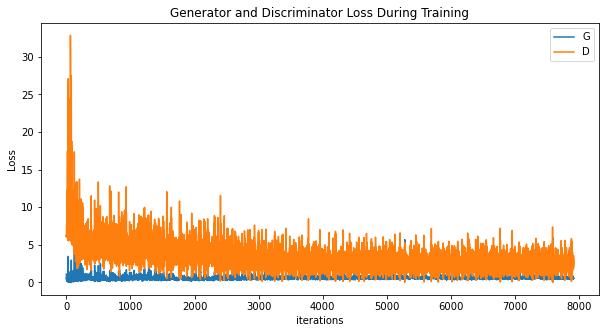

In [18]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Visualization of G’s progression

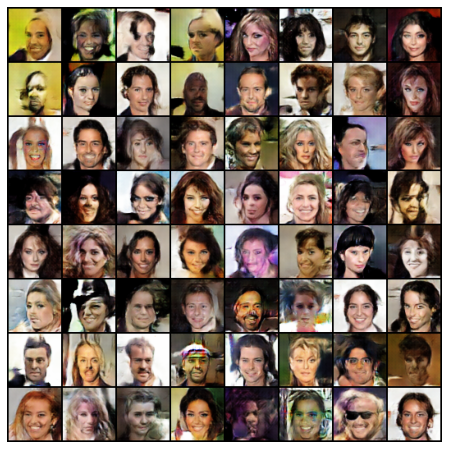

In [19]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

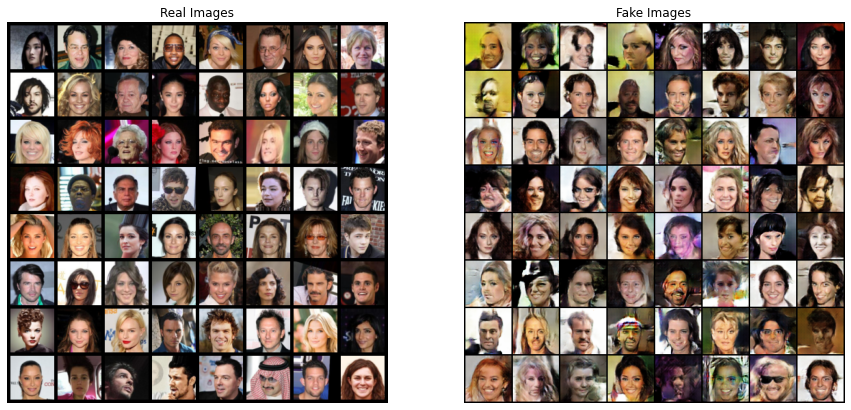

In [20]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Reference
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html